In [1]:
# -*- coding: utf-8 -*-
import json
import matplotlib.pyplot as plt
import numpy as np
import openturns as ot
import scipy.stats as ss

### MATPLOTLIB CONFIGURATION ###
plt.rcParams['figure.dpi']= 500
plt.rcParams['text.usetex'] = True

# Import Data

The dataset consists in a Monte Carlo design of experiments for the inputs $X_{\text{DEPO}} = X = (\alpha,\beta,\epsilon_{e},\epsilon_{c},d_{p},\Gamma_{p}(0), a_{v})^{T}\sim \mathbb{P}_{X} = \mathbb{P}_{X_{1}}\otimes\ldots\mathbb{P}_{X_{7}}$ with the corresponding output $g(X) = (g(t_{1},X),\ldots,g(t_{N},X))$ of time discretization of $N=75$. The given-dataset $\mathcal{D}_{n}$ is of size $n=10^3$.

In [2]:
### DATA IMPORT ###
dataset_hl = ot.Sample.ImportFromCSVFile('../../data/SG_MC_HL.csv')

In [3]:
### TIME INDICES ###
operation_time = np.load('../../data/SG_time.npy')

In [4]:
### INPUT SAMPLE ###
input_sample = np.asarray(dataset_hl[:,:7])

In [6]:
### CLOGGING OUTPUT SAMPLE ###
output_sample = np.asarray(dataset_hl[:,7:])

In [5]:
### INPUT VARIABLES LABELS ###
labels = [r'$\alpha$',
          r'$\beta$',
          r'$\epsilon_{e}$',
          r'$\epsilon_{c}$', 
          r'$d_{p}$',
          r'$\Gamma_{p}(0)$',
          r'$a_{v}$']

In [10]:
### MEAN OF THE OUTPUT SAMPLE ###
mean_hl = np.asarray([np.mean(np.asarray(output_sample[:,i])) for i in range(75)])

In [7]:
### PARAMETERS OF THE STEAM GENERATOR ###
input_dic = {}
input_dic['SG'] = json.load(open('../../data/SG_cleaning_conditioning.json'))

In [8]:
### COLOR SCHEME FOR CHEMICAL CONDITIONING ###
colors_chem_cond = {'C1': {'name': r'$\chi_{1}$', 'low': 'lightgreen', 'high': 'forestgreen'},
                    'C2': {'name': r'$\chi_{2}$', 'high': 'slateblue'}}

In [9]:
### DIFFERENT CHEMICAL CONDITIONING CUTS ###
times_in_different_conditioning = [4000, 7966, 13997]

# 2.3 Uncertainty quantification and propagation

## Trajectories obtained from Monte Carlo Simulations

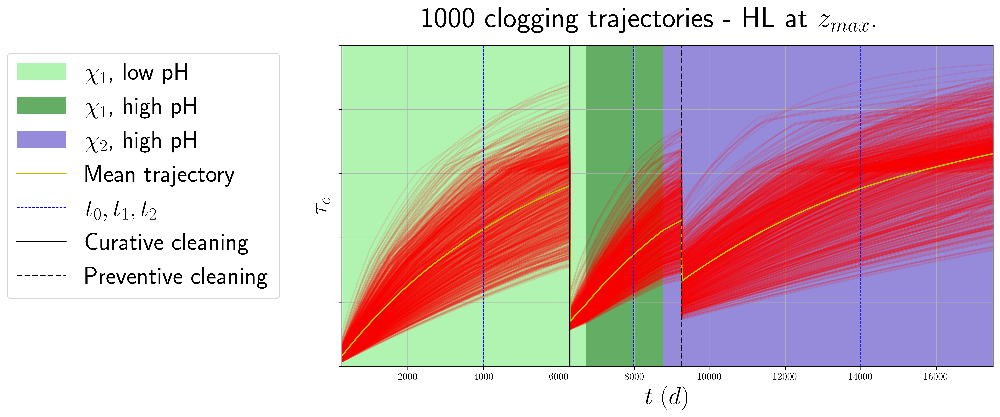

In [33]:
### FIG 3 ###

nrow, ncol = 1, 1
fig, axs = plt.subplots(nrow, ncol, figsize=(10,6), layout='tight')

#Chemical conditioning
cond = input_dic['SG']['chemistry']['conditioning']
for k in range(len(cond)):
    if k == len(cond)-1:
        t_i, t_f = cond[k]['time']/24, max(operation_time)
    else:
        t_i, t_f = cond[k]['time']/24, cond[k+1]['time']/24
    c = cond[k]
    typ = colors_chem_cond[c['type']]
    col = typ[str(c['ph'])]
    name = typ['name']
    axs.axvspan(t_i, t_f, facecolor=col, alpha=0.7, label='{0}, {1} pH'.format(name, c['ph']))

#Clogging trajectories
axs.grid()
for i in range(1000):
    axs.plot(operation_time, output_sample[i], c='r', alpha=0.1)
#Mean output
axs.plot(operation_time, mean_hl, color='y', linewidth=1.5, label='Mean trajectory')
axs.set_xlim(250,17500)
axs.set_ylim(0,100)
axs.axes.yaxis.set_ticklabels([])
axs.set_xlabel(r'$t\;(d)$', fontsize=25)
axs.set_ylabel(r'$\tau_c$', fontsize=25)

for i in range(2):
    axs.axvline(x=times_in_different_conditioning[i], color='b', linestyle='dashed', linewidth=0.75)

axs.axvline(x=times_in_different_conditioning[2], color='b', linestyle='dashed', linewidth=0.75, label=r'$t_{0}, t_{1}, t_{2}$')

#Cleaning dates
nett = input_dic['SG']['chemistry']['cleaning']
for k in range(len(nett)):
    if nett[k]['type'] == 'curative':
        axs.axvline(x=nett[k]['time']/24, color='k', linestyle='-', linewidth=1.5, label='Curative cleaning')

    elif nett[k]['type'] == 'preventive':
        axs.axvline(x=nett[k]['time']/24, color='k', linestyle='--', linewidth=1.5, label='Preventive cleaning')

#Legend
lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, bbox_to_anchor=(-0.01,0.9), fontsize=25)

#Save the figure
fig.suptitle(r'1000 clogging trajectories - HL at $z_{max}$.', fontsize=30)
fig.savefig('../plots/TPD/TPD_MC_trajectories.pdf', format='pdf', bbox_inches='tight')
fig.savefig('../plots/TPD/TPD_MC_trajectories.png', format='png', bbox_inches='tight')

        

## Densities of clogging kinetics for various chemical regimes

In [14]:
deltas_ch = np.asarray([output_sample[:, np.where(operation_time == j)[0][0] + 1 ] - output_sample[:, np.where(operation_time == j)[0][0]] for j in times_in_different_conditioning])

In [ ]:
### FIG 4 ###

fig, ax = plt.subplots(1,1)
colors = ['lightgreen', 'forestgreen', 'slateblue']
for i in range(len(deltas_ch)):
    density_function = ss.gaussian_kde(deltas_ch[i], bw_method=0.3)
    x = np.linspace(0, 5, 1000)
    ax.plot(x, density_function(x), color=colors[i], label=r'$t_{0}$'.format(i))
    ax.hist(deltas_ch[i], color=colors[i], alpha=0.6, density=True)
ax.set_xlabel(r'$| \Delta \tau_{c}|$', fontsize=12)
ax.set_xlim(0.0, 5.0)
ax.legend(fontsize=20)
ax.set_title('Clogging kinetics in the three chemical conditionings.', fontsize=17)
ax.set_yticks([])

fig.savefig('../plots/TPD/TPD_MC_clogging_kinetics.pdf', format='pdf', bbox_inches='tight')
fig.savefig('../plots/TPD/TPD_MC_clogging_kinetics.png', format='png', bbox_inches='tight')

## Output scatter plots at different times in physical space and in rank space

In [63]:
### TIME CUTS ON THE OUTPUT SAMPLE ###
output_sample_cuts = np.asarray([output_sample[:,np.where(operation_time==times_in_different_conditioning[i])] for i in range(3)])

In [64]:
### RANKING OF INPUT/OUTPUT ###
input_sample_ranked = np.asarray([ss.rankdata(input_sample[:,i]) for i in range(7)])
output_sample_cuts_ranked = np.asarray([ss.rankdata(output_sample_cuts[i,:]) for i in range(3)])

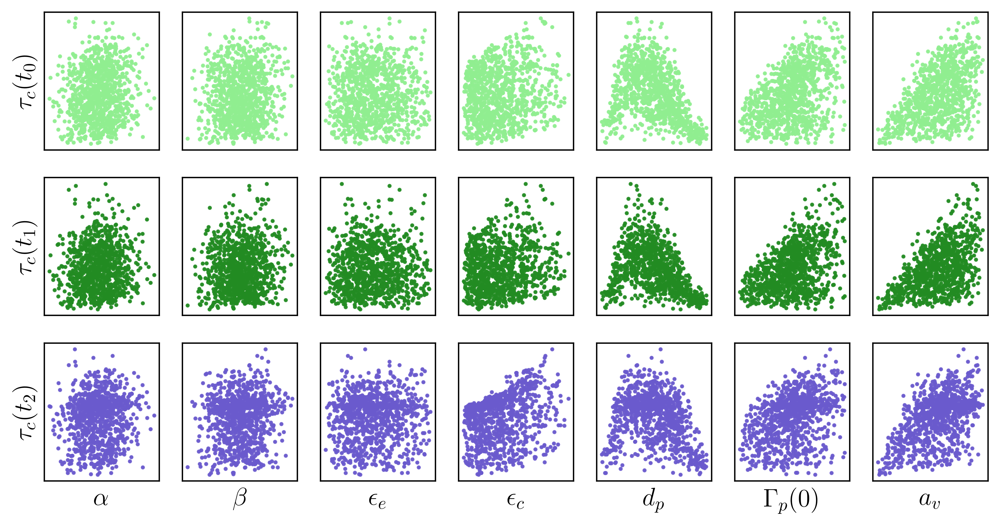

In [65]:
### SCATTER PLOT IN THE PHYSICAL SPACE ###
fig, axs = plt.subplots(3, 7, figsize=(10,5))
colors = ['lightgreen', 'forestgreen', 'slateblue']
for k in range(3):
    for j in range(7):
        axs[k,j].scatter(input_sample[:,j], output_sample_cuts[k,:], label=labels[j], c=colors[k], alpha=0.9, s=2)
        axs[k,j].set_xticklabels([])
        axs[k,j].set_yticklabels([])
        axs[k,j].set_xticks([])
        axs[k,j].set_yticks([])
        if k == 2:
            axs[k,j].set_xlabel(labels[j], fontsize=15)
    axs[k,0].set_ylabel(r'$\tau_c$$(t_{})$'.format(k), fontsize=15)

fig.savefig('../plots/TPD/TPD_MC_scatter_plots.pdf', format='pdf', bbox_inches='tight')
fig.savefig('../plots/TPD/TPD_MC_scatter_plots.png', format='png', bbox_inches='tight')

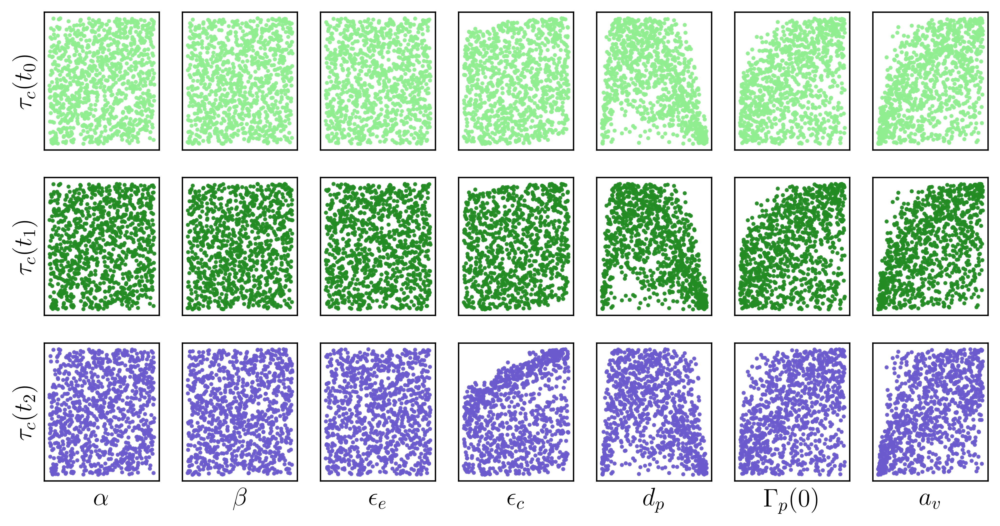

In [45]:
### FIG 5 ###
### SCATTER PLOT IN THE RANK SPACE ###
fig, axs = plt.subplots(3, 7, figsize=(10,5))
colors = ['lightgreen', 'forestgreen', 'slateblue']
for k in range(3):
    for j in range(7):
        axs[k,j].scatter(input_sample_ranked[j,:], output_sample_cuts_ranked[k,:], label=labels[j], c=colors[k], alpha=0.9, s=2)
        axs[k,j].set_xticklabels([])
        axs[k,j].set_yticklabels([])
        axs[k,j].set_xticks([])
        axs[k,j].set_yticks([])
        if k == 2:
            axs[k,j].set_xlabel(labels[j], fontsize=15)
    axs[k,0].set_ylabel(r'$\tau_c$$(t_{})$'.format(k), fontsize=15)

fig.savefig('../plots/TPD/TPD_MC_scatter_plots_ranked.pdf', format='pdf', bbox_inches='tight')
fig.savefig('../plots/TPD/TPD_MC_scatter_plots_ranked.png', format='png', bbox_inches='tight')